In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 64), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  645.7 3.2355 0.320175


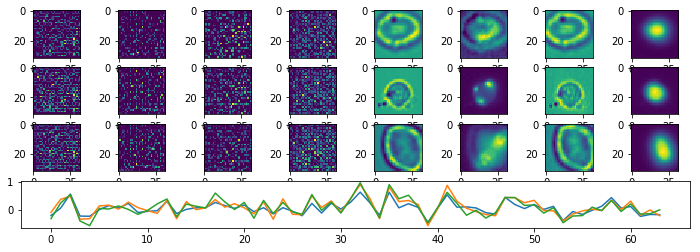

Epoch:  1 Iteration:  0 Loss:  19.3459 0.638497 0.00245786


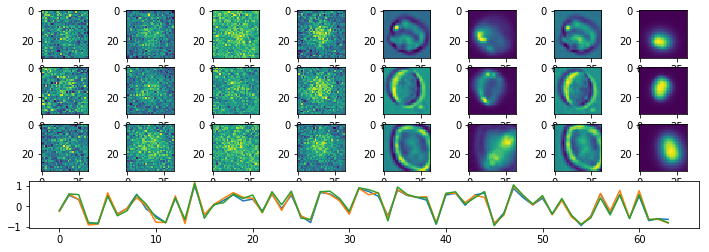

Epoch:  2 Iteration:  0 Loss:  16.114 0.636636 0.00295588


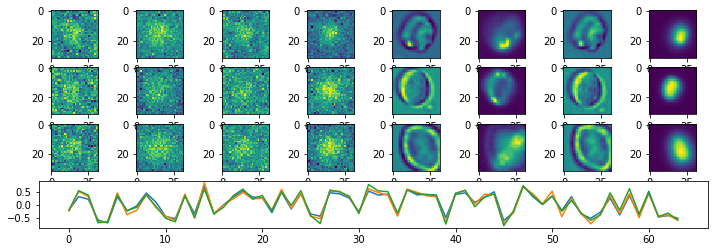

Epoch:  3 Iteration:  0 Loss:  14.0286 0.635475 0.00212783


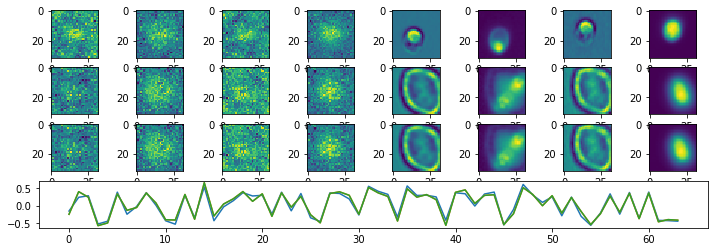

Epoch:  4 Iteration:  0 Loss:  12.8168 0.634844 0.00201789


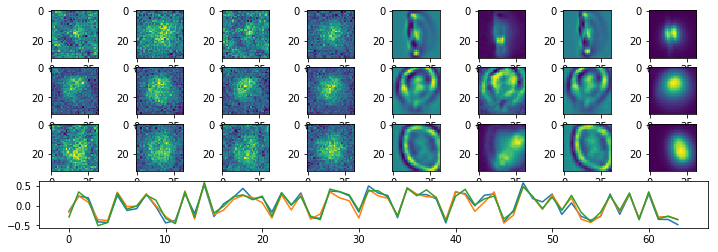

Epoch:  5 Iteration:  0 Loss:  12.4498 0.634645 0.00116175


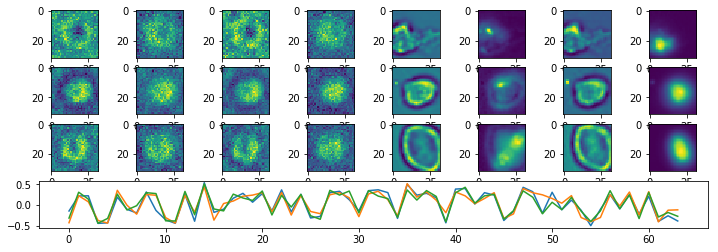

Epoch:  6 Iteration:  0 Loss:  11.0776 0.633957 0.00210336


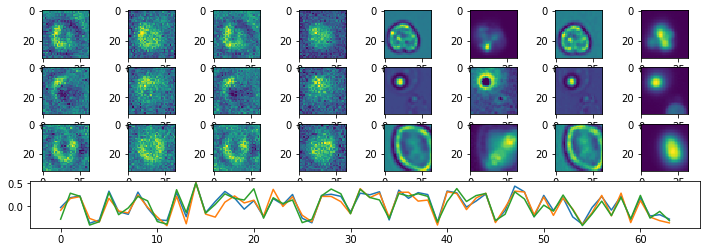

Epoch:  7 Iteration:  0 Loss:  10.383 0.633599 0.00208548


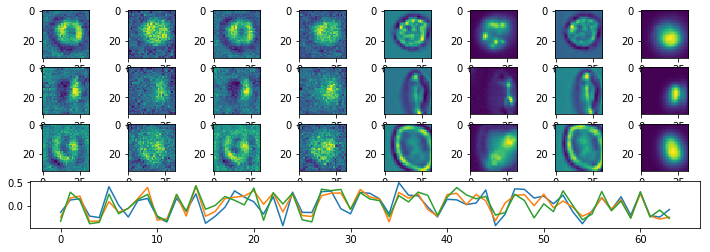

Epoch:  8 Iteration:  0 Loss:  9.65818 0.63321 0.0018245


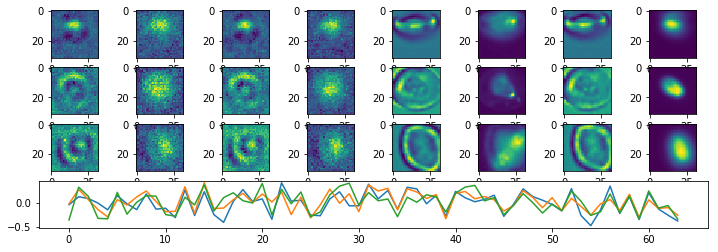

Epoch:  9 Iteration:  0 Loss:  8.97884 0.632849 0.00175706


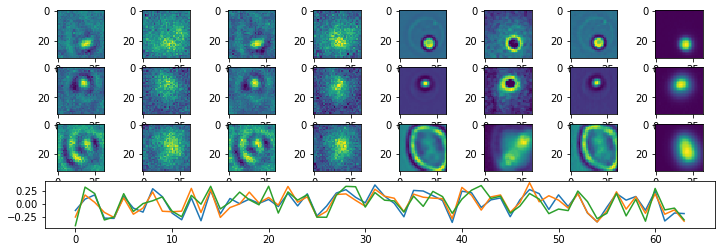

Epoch:  10 Iteration:  0 Loss:  8.42763 0.632561 0.00190049


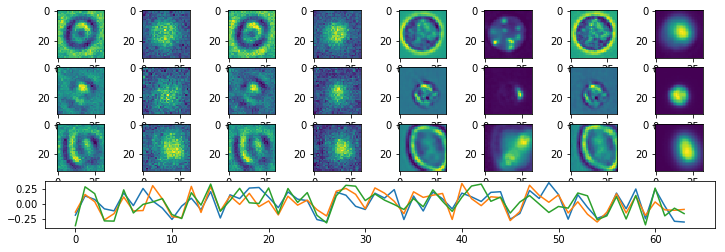

Epoch:  11 Iteration:  0 Loss:  8.10025 0.632392 0.00195074


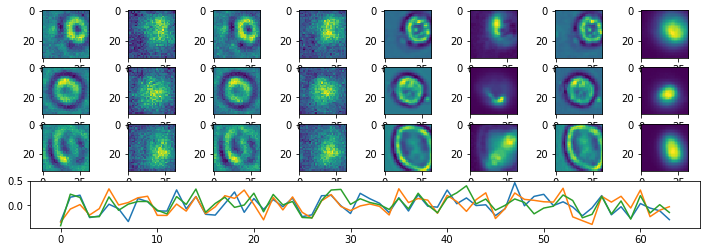

Epoch:  12 Iteration:  0 Loss:  7.67256 0.632169 0.00155684


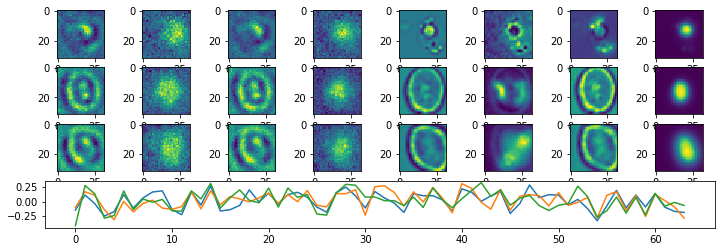

Epoch:  13 Iteration:  0 Loss:  7.52704 0.632097 0.00184634


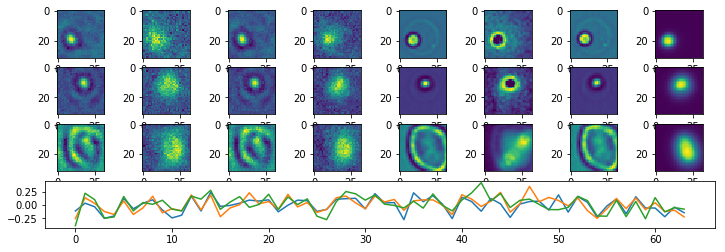

Epoch:  14 Iteration:  0 Loss:  7.07073 0.631858 0.00103915


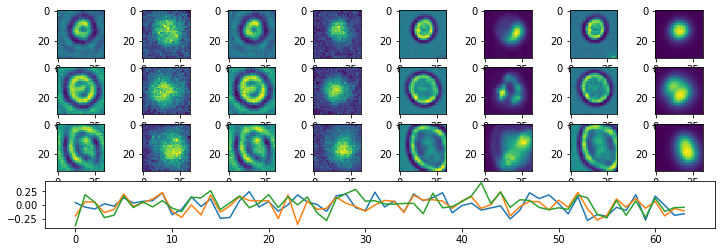

Epoch:  15 Iteration:  0 Loss:  6.88355 0.63176 0.00133669


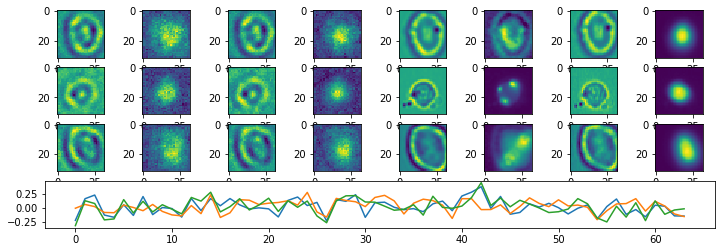

Epoch:  16 Iteration:  0 Loss:  6.6576 0.631643 0.00153619


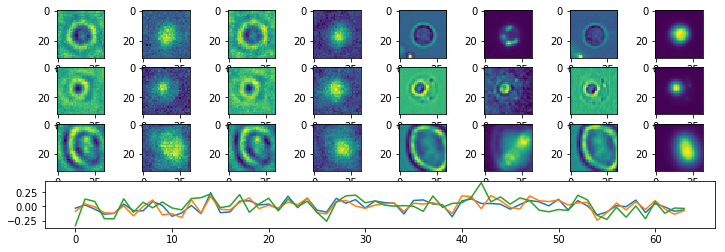

Epoch:  17 Iteration:  0 Loss:  6.53519 0.631577 0.0019072


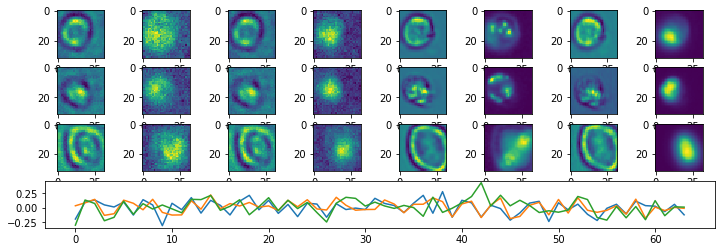

Epoch:  18 Iteration:  0 Loss:  6.31935 0.631467 0.00154495


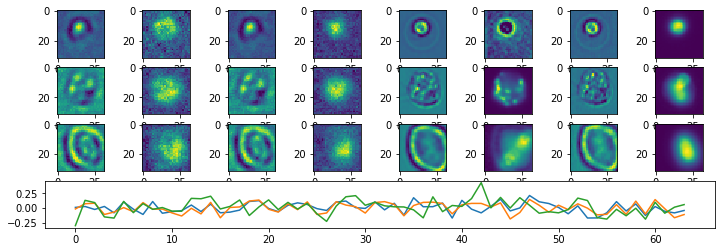

Epoch:  19 Iteration:  0 Loss:  6.16775 0.63139 0.00137955


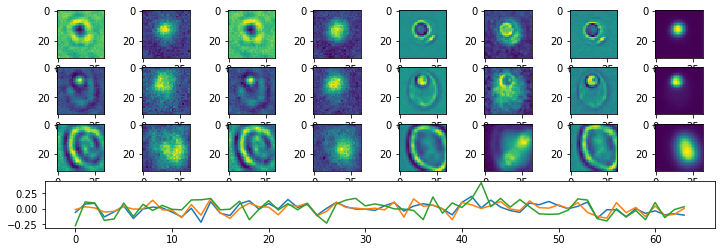

Epoch:  20 Iteration:  0 Loss:  6.06285 0.631334 0.00112131


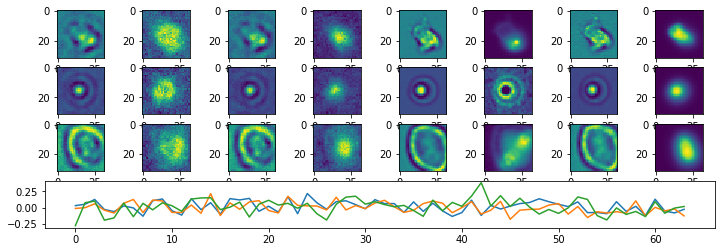

Epoch:  21 Iteration:  0 Loss:  5.9499 0.631275 0.0015038


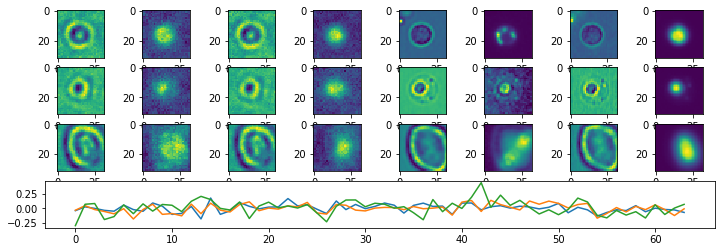

Epoch:  22 Iteration:  0 Loss:  5.79095 0.631192 0.00121036


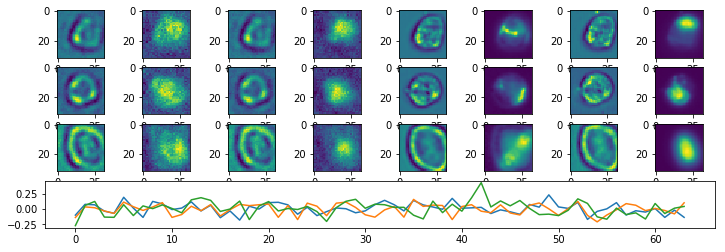

Epoch:  23 Iteration:  0 Loss:  5.71133 0.63115 0.00129911


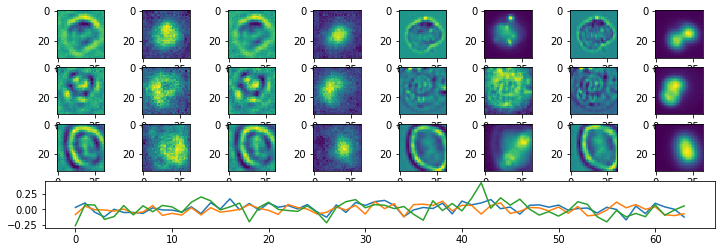

Epoch:  24 Iteration:  0 Loss:  5.77809 0.631186 0.0014109


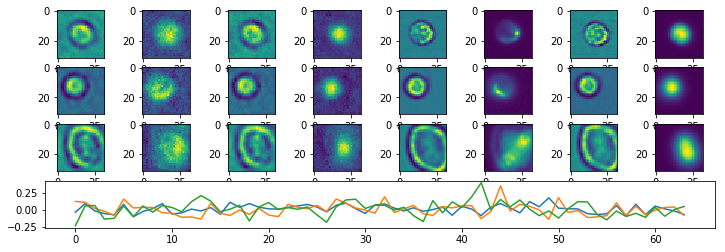

Epoch:  25 Iteration:  0 Loss:  5.56203 0.631073 0.00111341


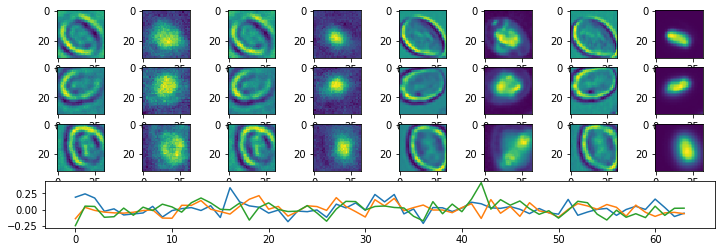

Epoch:  26 Iteration:  0 Loss:  5.52959 0.631056 0.000965238


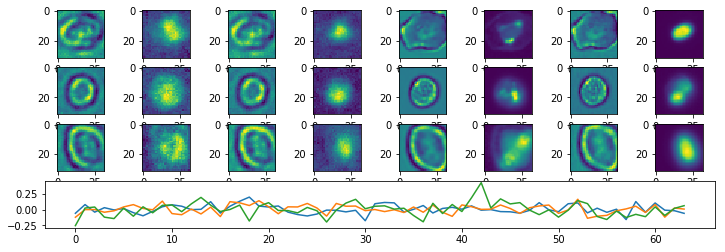

Epoch:  27 Iteration:  0 Loss:  5.43389 0.631003 0.00169781


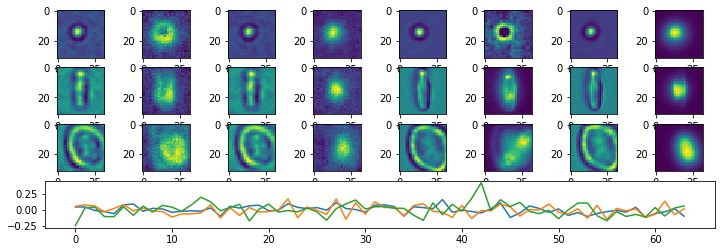

Epoch:  28 Iteration:  0 Loss:  5.36123 0.630965 0.00106585


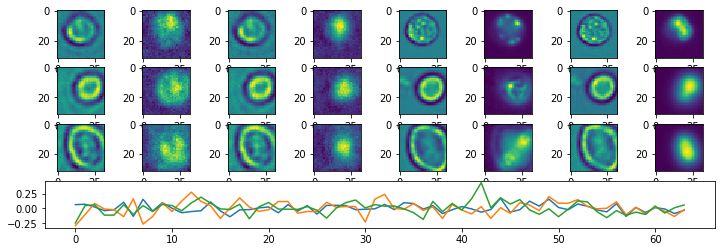

Epoch:  29 Iteration:  0 Loss:  5.25792 0.630909 0.000820667


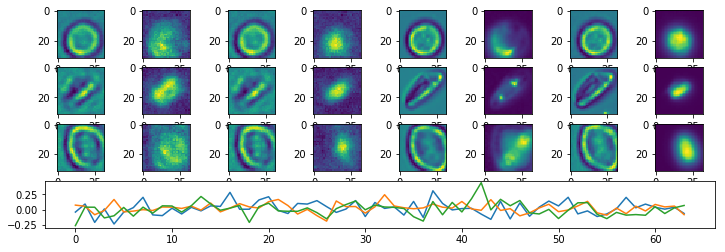

Epoch:  30 Iteration:  0 Loss:  5.22469 0.630886 0.00165179


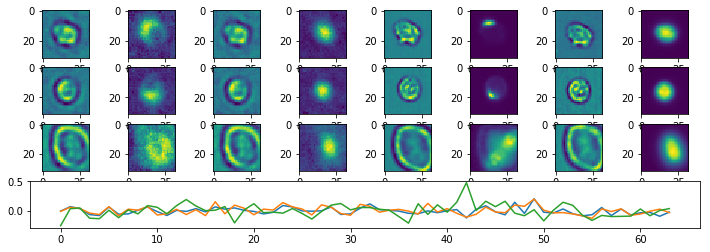

Epoch:  31 Iteration:  0 Loss:  5.13633 0.630843 0.00102362


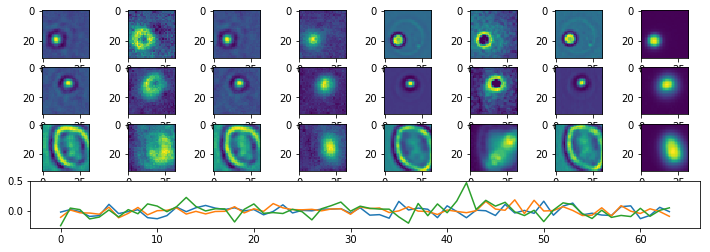

Epoch:  32 Iteration:  0 Loss:  5.01559 0.630778 0.00124896


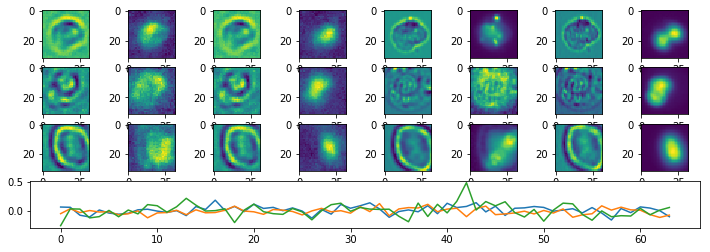

Epoch:  33 Iteration:  0 Loss:  5.02496 0.630782 0.00121373


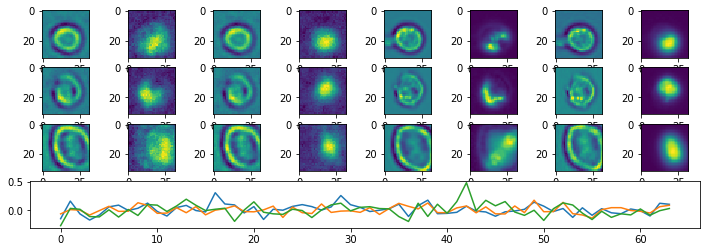

Epoch:  34 Iteration:  0 Loss:  4.92253 0.630728 0.00115341


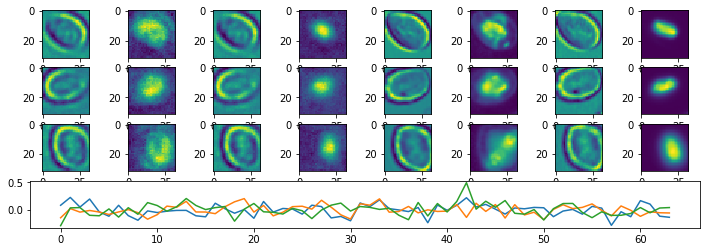

Epoch:  35 Iteration:  0 Loss:  4.90044 0.630716 0.0012973


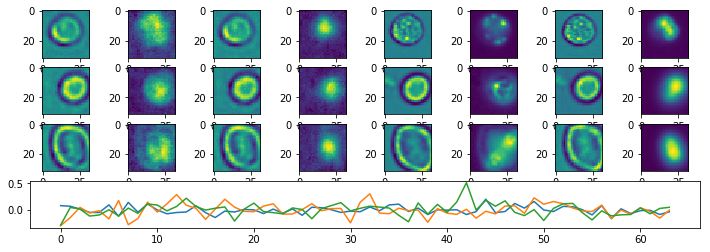

Epoch:  36 Iteration:  0 Loss:  4.80921 0.63067 0.00106287


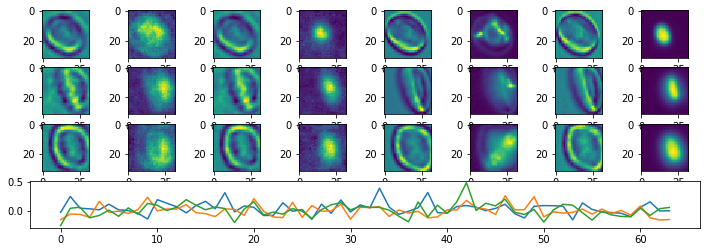

Epoch:  37 Iteration:  0 Loss:  4.78706 0.630659 0.000641882


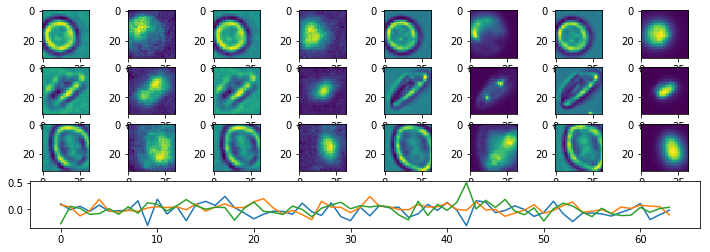

Epoch:  38 Iteration:  0 Loss:  4.7076 0.630616 0.00127116


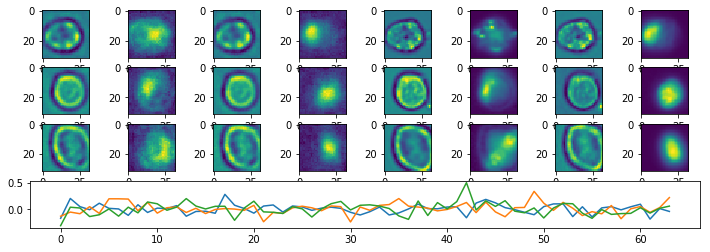

Epoch:  39 Iteration:  0 Loss:  4.74459 0.630636 0.000965655


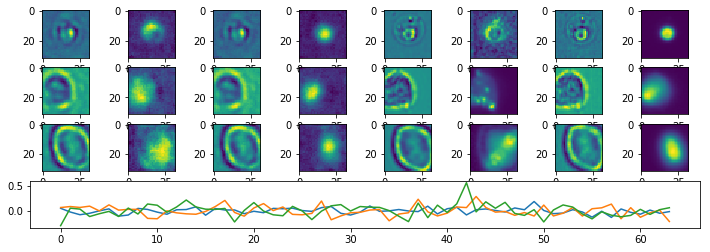

Epoch:  40 Iteration:  0 Loss:  4.69549 0.630609 0.00112194


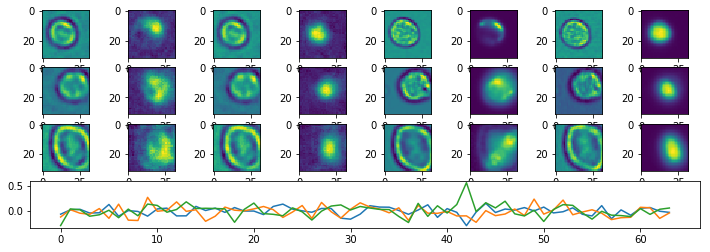

Epoch:  41 Iteration:  0 Loss:  4.59929 0.63056 0.000822097


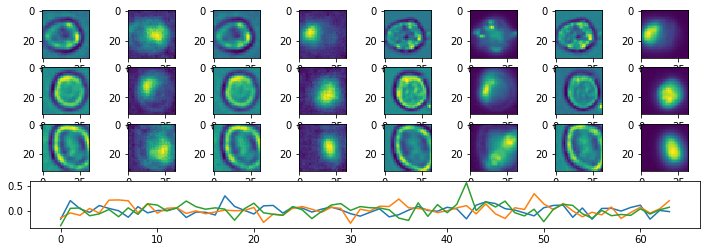

Epoch:  42 Iteration:  0 Loss:  4.55039 0.630535 0.000808179


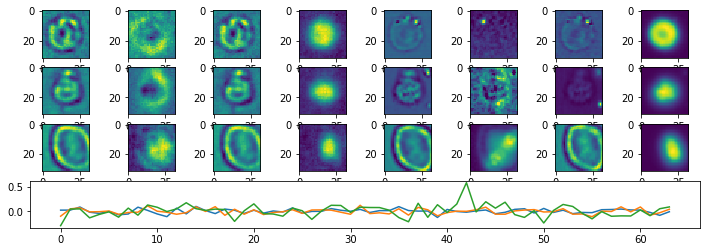

Epoch:  43 Iteration:  0 Loss:  4.54138 0.630529 0.00109404


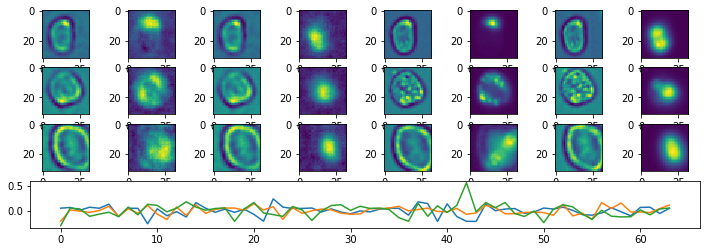

Epoch:  44 Iteration:  0 Loss:  4.47587 0.630496 0.000624061


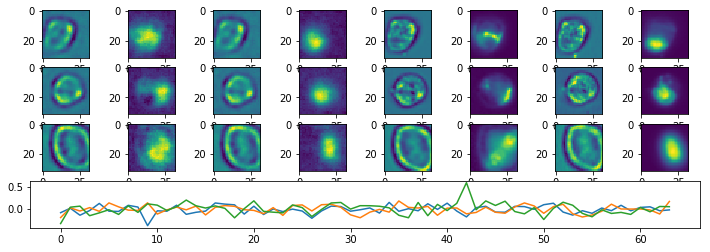

Epoch:  45 Iteration:  0 Loss:  4.43257 0.630473 0.000868887


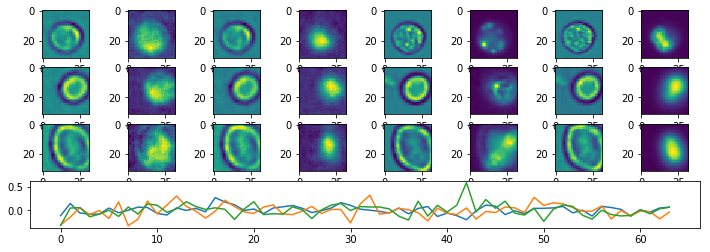

Epoch:  46 Iteration:  0 Loss:  4.39081 0.630451 0.00071016


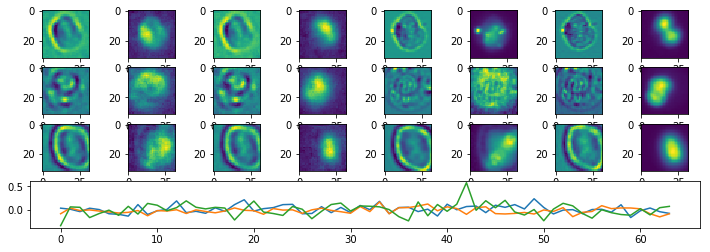

Epoch:  47 Iteration:  0 Loss:  4.35347 0.630432 0.000691533


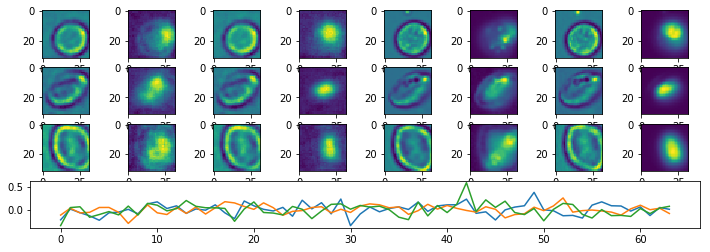

Epoch:  48 Iteration:  0 Loss:  4.35558 0.630433 0.000476778


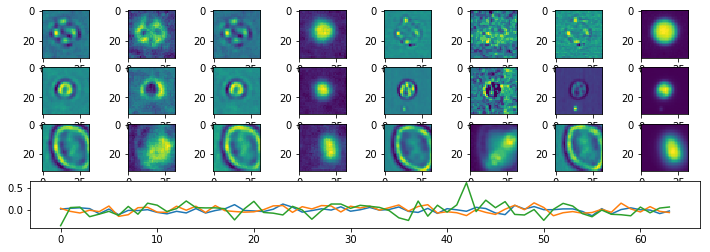

Epoch:  49 Iteration:  0 Loss:  4.29754 0.630403 0.000931293


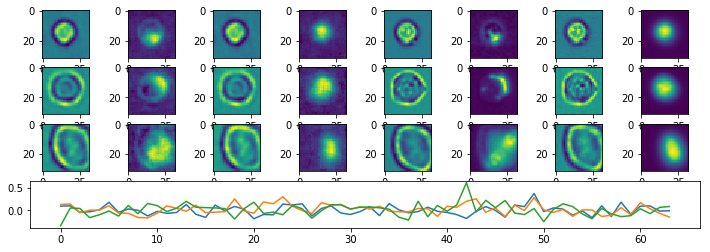

Epoch:  50 Iteration:  0 Loss:  4.24779 0.630378 0.000864565


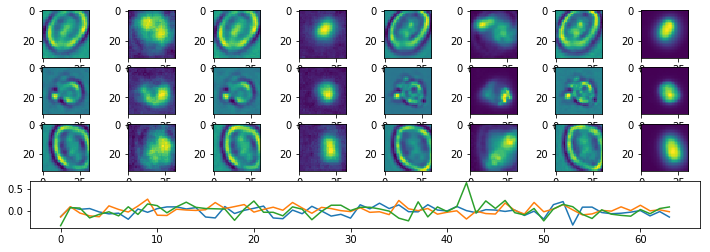

Epoch:  51 Iteration:  0 Loss:  4.22182 0.630364 0.000609875


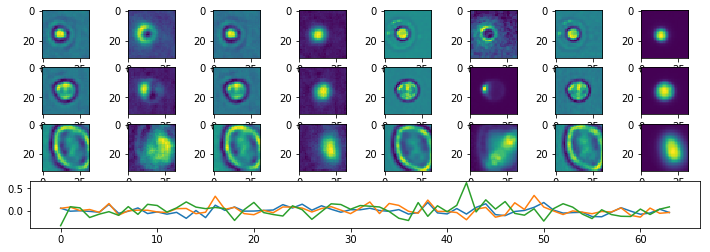

Epoch:  52 Iteration:  0 Loss:  4.2417 0.630374 0.000954598


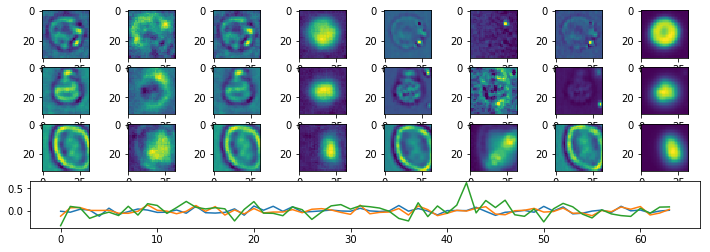

Epoch:  53 Iteration:  0 Loss:  4.16584 0.630334 0.000898361


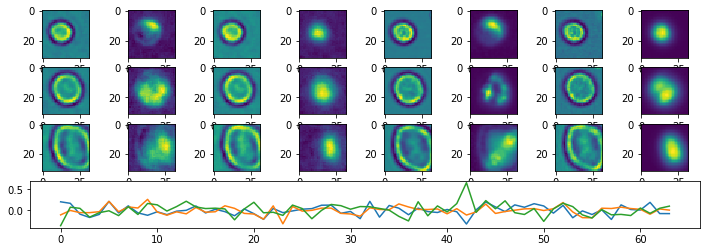

Epoch:  54 Iteration:  0 Loss:  4.19617 0.63035 0.000721455


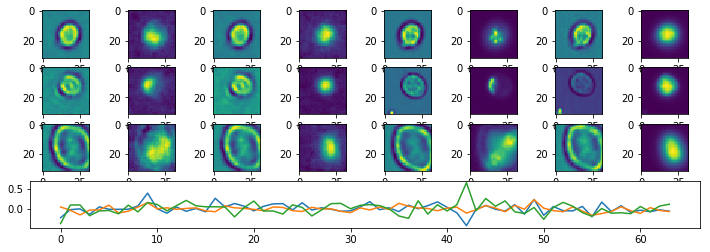

Epoch:  55 Iteration:  0 Loss:  4.20423 0.630355 0.000819713


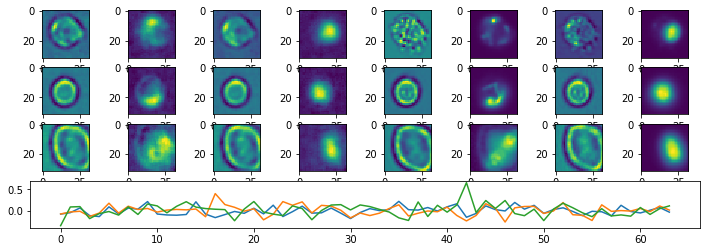

Epoch:  56 Iteration:  0 Loss:  4.10821 0.630305 0.000936061


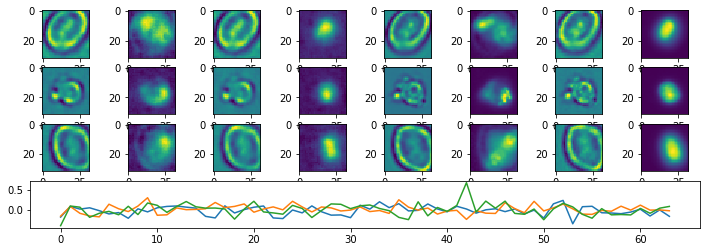

Epoch:  57 Iteration:  0 Loss:  4.13502 0.63032 0.000924438


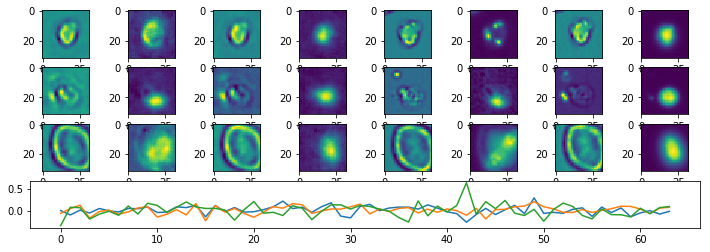

Epoch:  58 Iteration:  0 Loss:  4.12833 0.630316 0.000619113


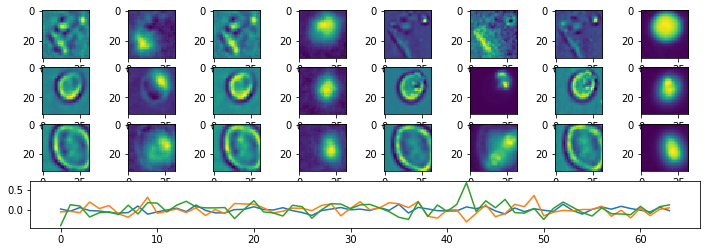

Epoch:  59 Iteration:  0 Loss:  4.05593 0.630278 0.000596642


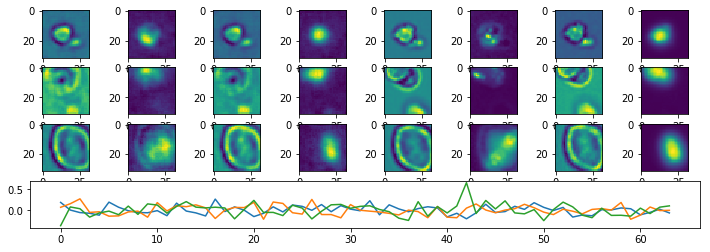

Epoch:  60 Iteration:  0 Loss:  4.01788 0.630258 0.000720084


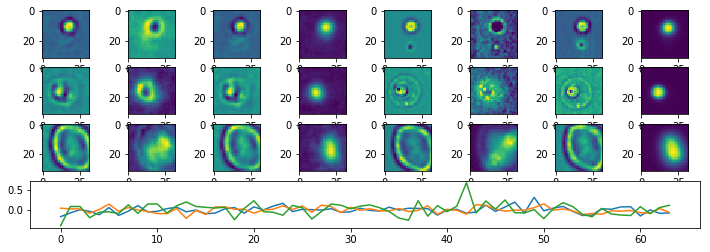

Epoch:  61 Iteration:  0 Loss:  4.02953 0.630264 0.000836879


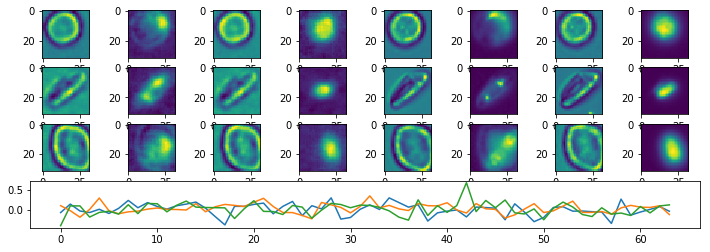

Epoch:  62 Iteration:  0 Loss:  4.06329 0.630282 0.000766903


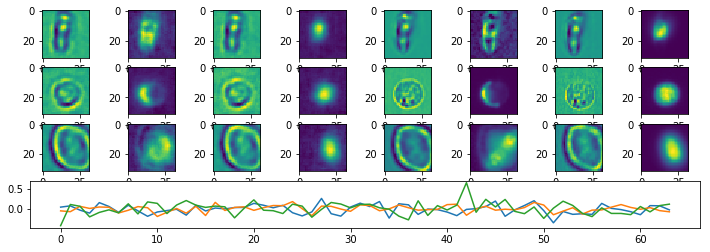

Epoch:  63 Iteration:  0 Loss:  4.04452 0.630273 0.000585943


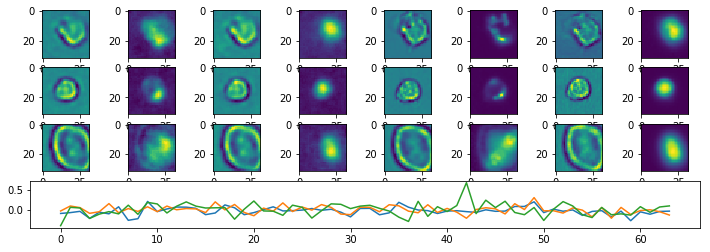

Epoch:  64 Iteration:  0 Loss:  3.99519 0.630246 0.000540137


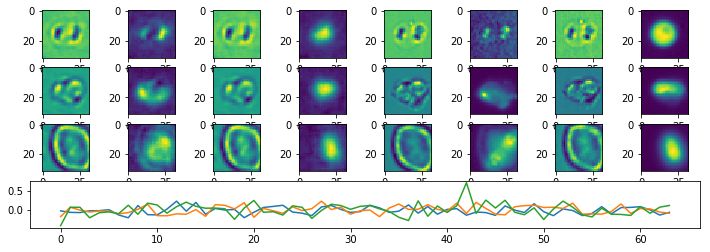

Epoch:  65 Iteration:  0 Loss:  4.02184 0.630259 0.000755817


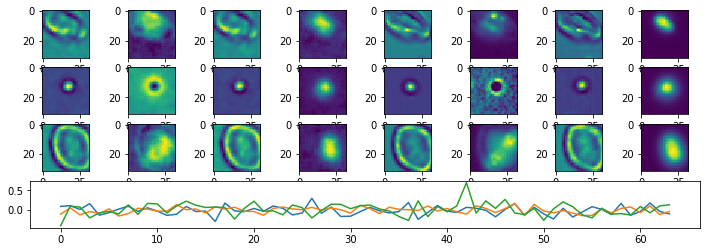

Epoch:  66 Iteration:  0 Loss:  3.96592 0.630231 0.00088954


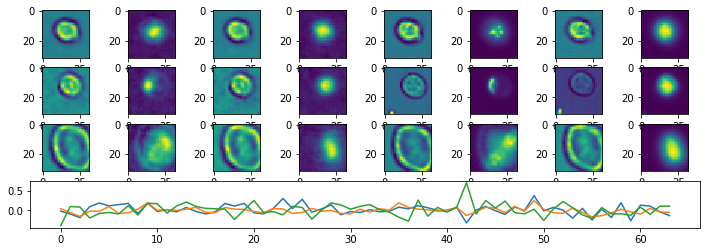

Epoch:  67 Iteration:  0 Loss:  3.9605 0.630229 0.000708789


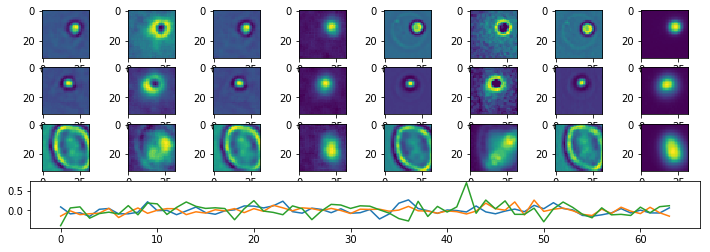

Epoch:  68 Iteration:  0 Loss:  3.98589 0.630242 0.000944704


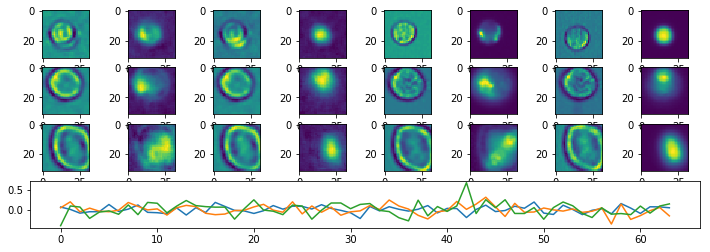

Epoch:  69 Iteration:  0 Loss:  3.98503 0.630241 0.000803828


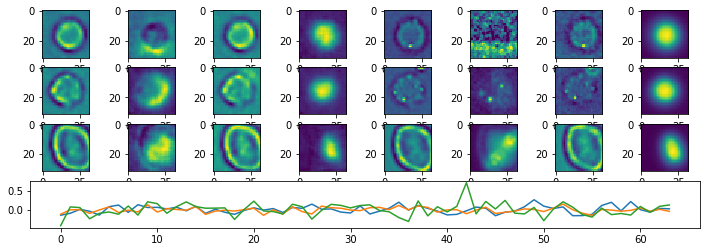

Epoch:  70 Iteration:  0 Loss:  3.90969 0.630202 0.000779361


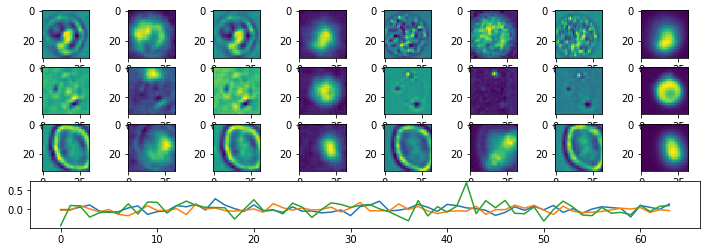

Epoch:  71 Iteration:  0 Loss:  3.90338 0.630198 0.000825524


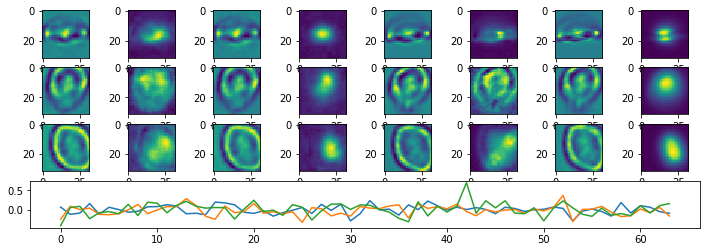

Epoch:  72 Iteration:  0 Loss:  3.89495 0.630194 0.000715017


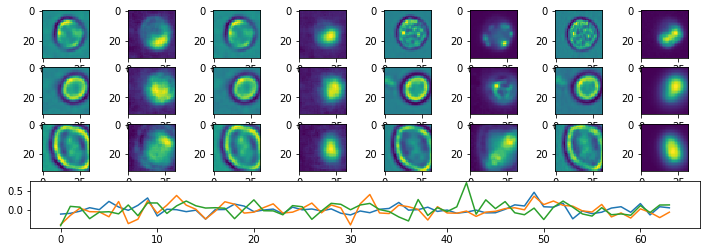

Epoch:  73 Iteration:  0 Loss:  3.90273 0.630198 0.000500768


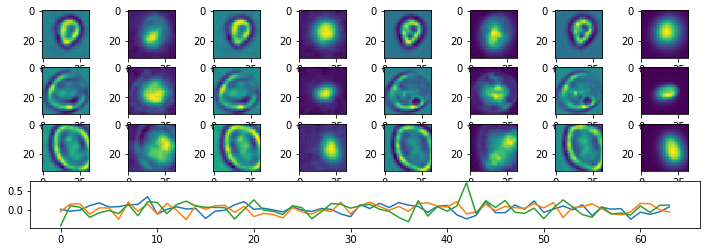

Epoch:  74 Iteration:  0 Loss:  3.86971 0.63018 0.000758201


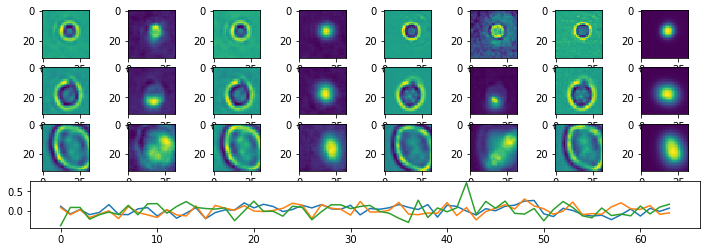

Epoch:  75 Iteration:  0 Loss:  3.88838 0.630191 0.000648111


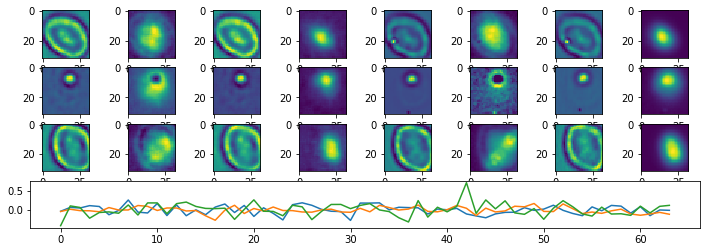

Epoch:  76 Iteration:  0 Loss:  3.85676 0.630174 0.000792772


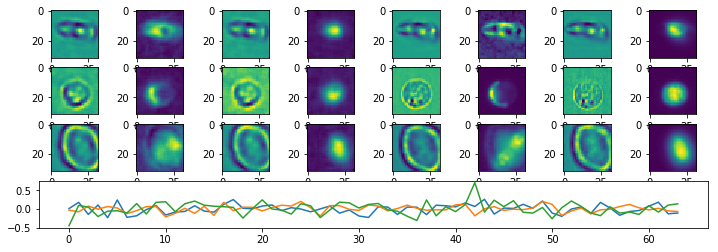

Epoch:  77 Iteration:  0 Loss:  3.92552 0.630211 0.000741333


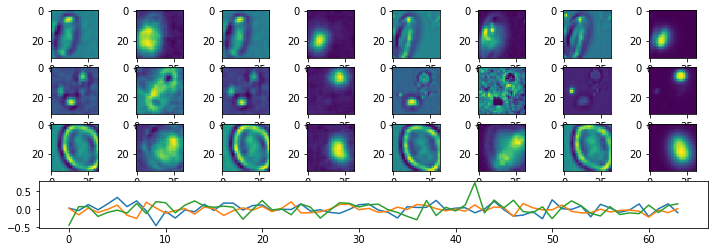

Epoch:  78 Iteration:  0 Loss:  3.84099 0.630166 0.000622332


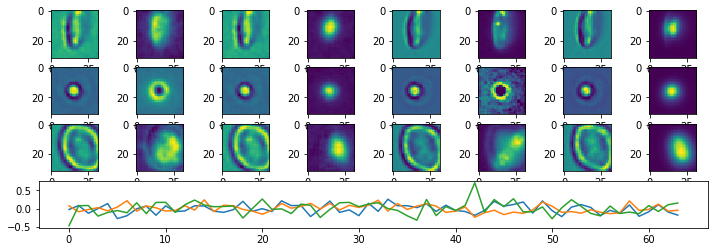

Epoch:  79 Iteration:  0 Loss:  3.84157 0.630166 0.000833064


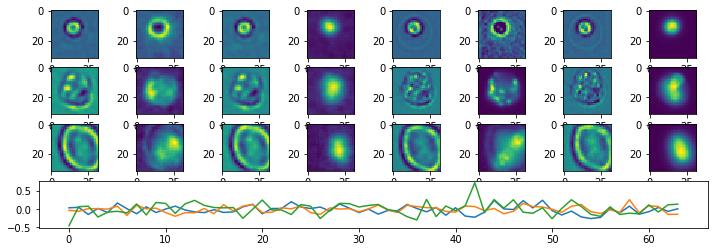

Epoch:  80 Iteration:  0 Loss:  3.8289 0.63016 0.000696152


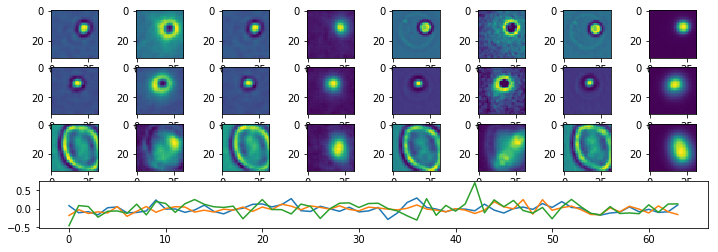

Epoch:  81 Iteration:  0 Loss:  3.80931 0.63015 0.000573218


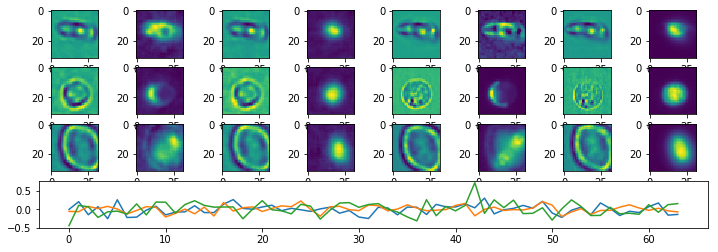

Epoch:  82 Iteration:  0 Loss:  3.80042 0.630145 0.000677615


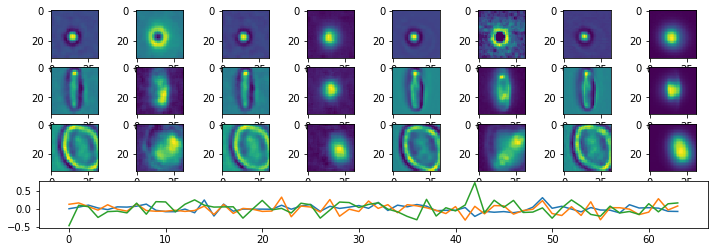

Epoch:  83 Iteration:  0 Loss:  3.75531 0.630122 0.000638038


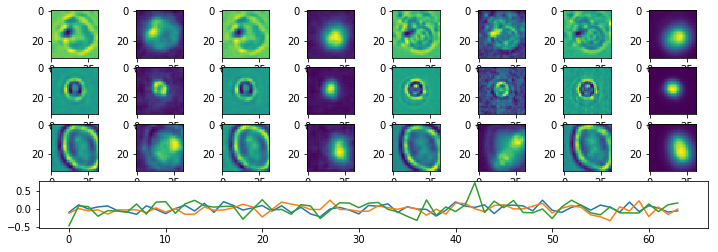

Epoch:  84 Iteration:  0 Loss:  3.74805 0.630118 0.000570148


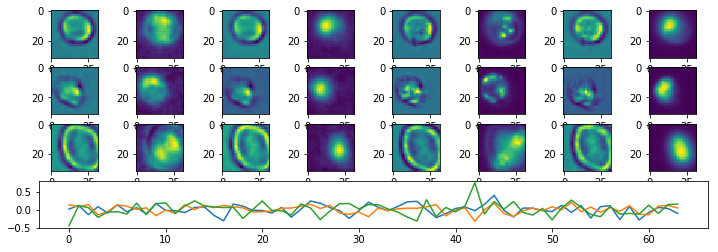

Epoch:  85 Iteration:  0 Loss:  3.82926 0.630161 0.000772595


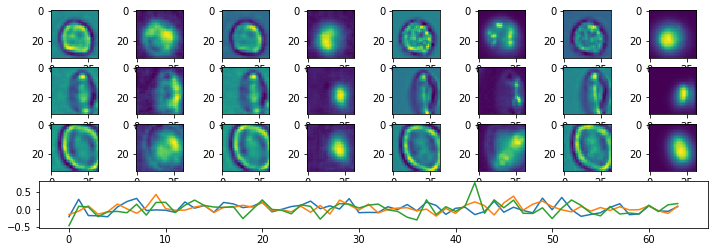

Epoch:  86 Iteration:  0 Loss:  3.75715 0.630123 0.000704914


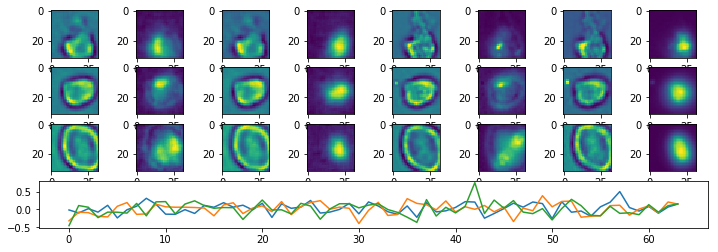

Epoch:  87 Iteration:  0 Loss:  3.78759 0.63014 0.00074017


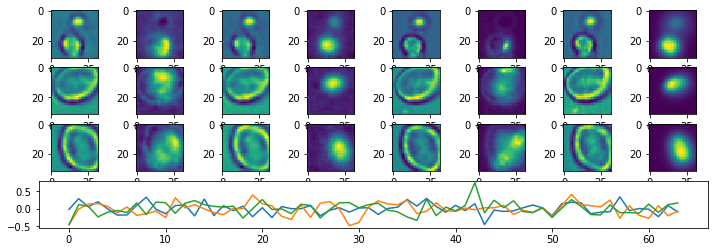

Epoch:  88 Iteration:  0 Loss:  3.75072 0.63012 0.000652373


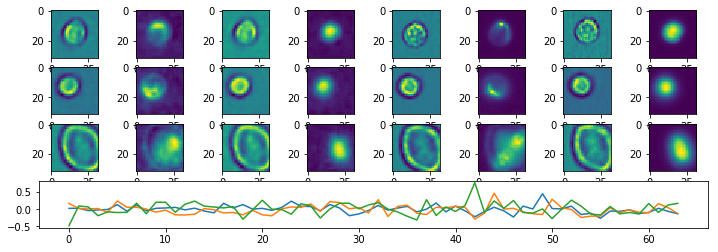

Epoch:  89 Iteration:  0 Loss:  3.70754 0.630099 0.000721306


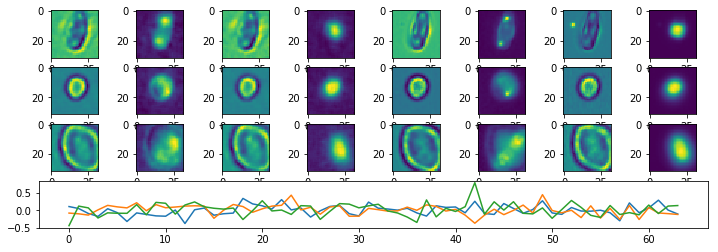

Epoch:  90 Iteration:  0 Loss:  3.76972 0.630131 0.000567973


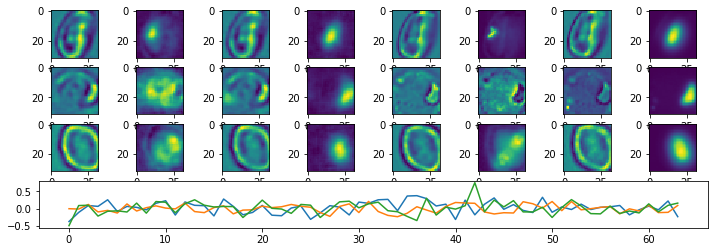

Epoch:  91 Iteration:  0 Loss:  3.77796 0.630136 0.000633061


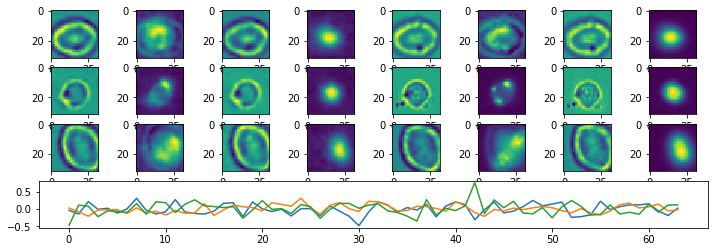

Epoch:  92 Iteration:  0 Loss:  3.71115 0.6301 0.000508755


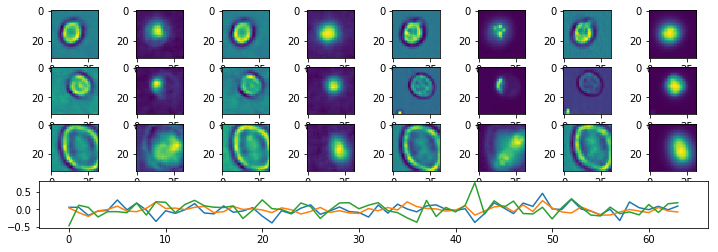

Epoch:  93 Iteration:  0 Loss:  3.7072 0.630098 0.000593215


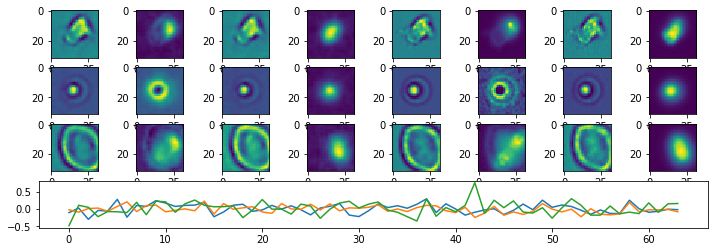

Epoch:  94 Iteration:  0 Loss:  3.70629 0.630098 0.000552207


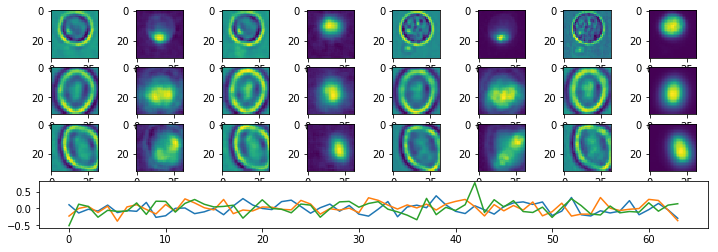

Epoch:  95 Iteration:  0 Loss:  3.71989 0.630105 0.000744164


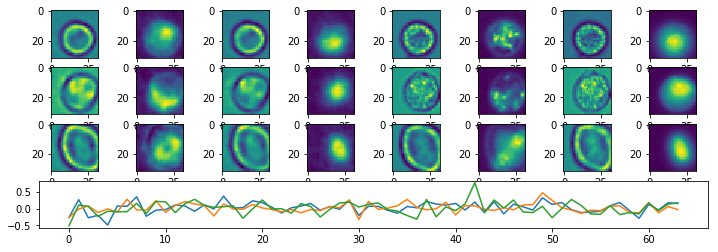

Epoch:  96 Iteration:  0 Loss:  3.67351 0.63008 0.000581801


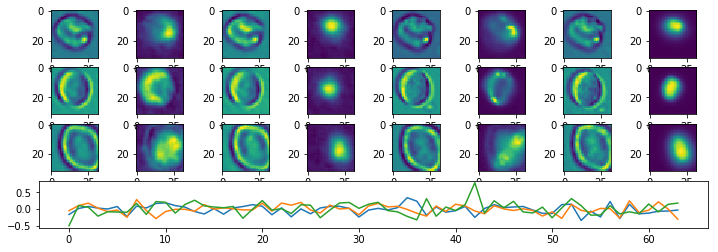

Epoch:  97 Iteration:  0 Loss:  3.65899 0.630073 0.000568658


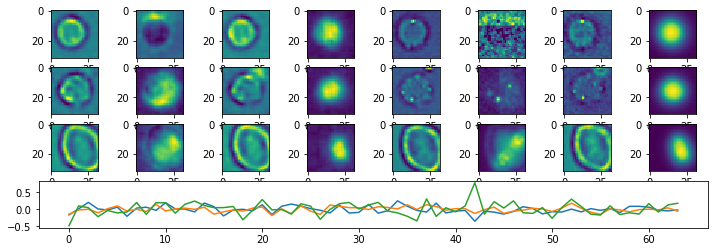

Epoch:  98 Iteration:  0 Loss:  3.66571 0.630076 0.000685811


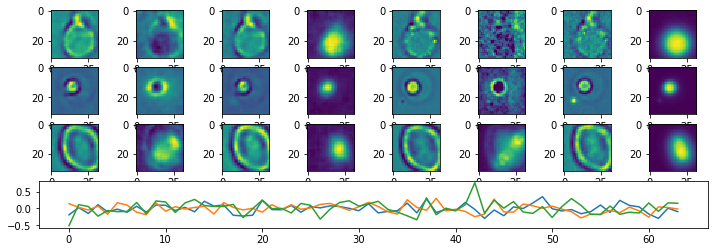

Epoch:  99 Iteration:  0 Loss:  3.64867 0.630068 0.000674427


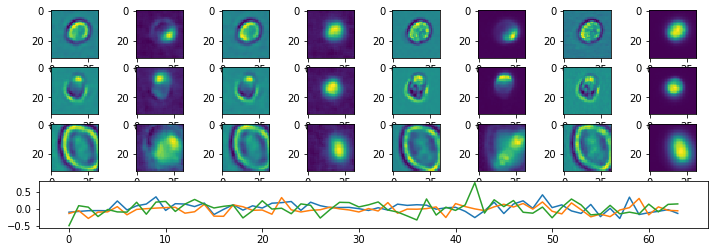

Epoch:  100 Iteration:  0 Loss:  3.6491 0.630068 0.000674248


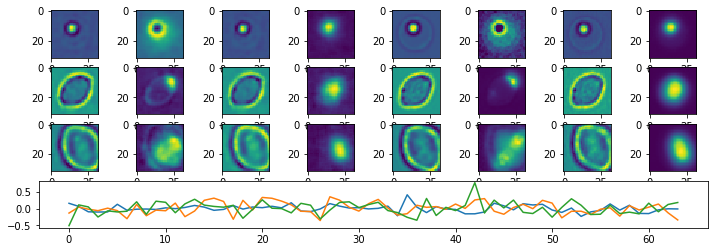

Epoch:  101 Iteration:  0 Loss:  3.67771 0.630084 0.000789106


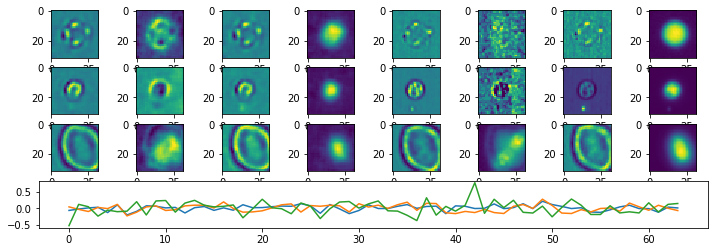

Epoch:  102 Iteration:  0 Loss:  3.62084 0.630053 0.000683427


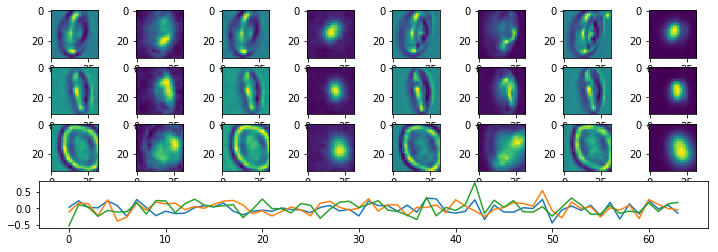

Epoch:  103 Iteration:  0 Loss:  3.64938 0.630068 0.000812769


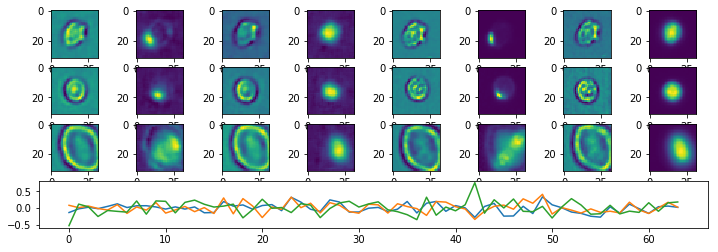

Epoch:  104 Iteration:  0 Loss:  3.61275 0.63005 0.000679225


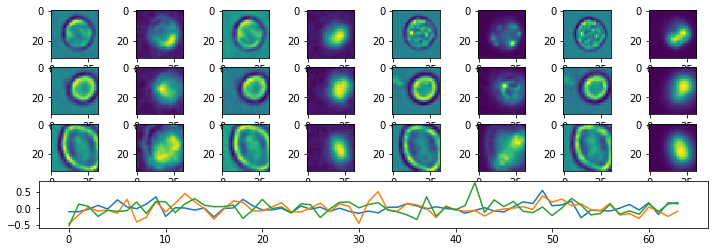

Epoch:  105 Iteration:  0 Loss:  4.28675 0.630396 0.00068453


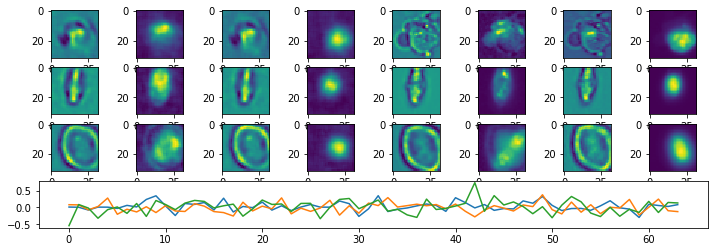

Epoch:  106 Iteration:  0 Loss:  3.95266 0.630224 0.000785887


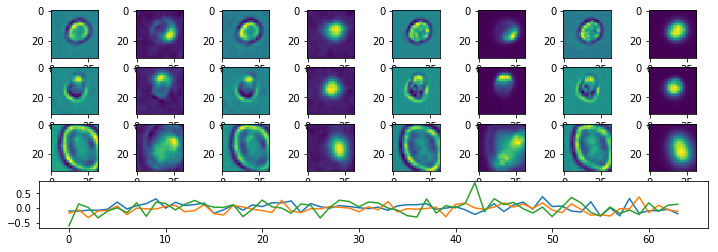

Epoch:  107 Iteration:  0 Loss:  3.87549 0.630183 0.000645399


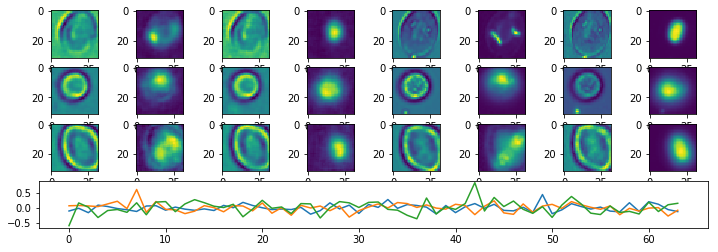

Epoch:  108 Iteration:  0 Loss:  3.74876 0.630119 0.000557303


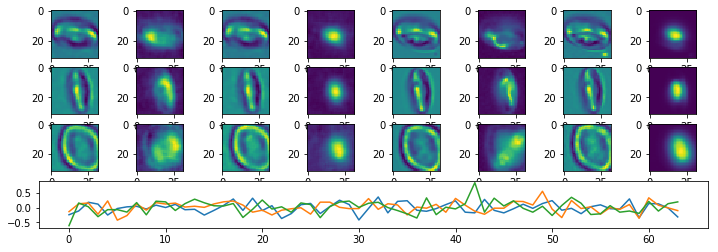

Epoch:  109 Iteration:  0 Loss:  3.70402 0.630096 0.00063628


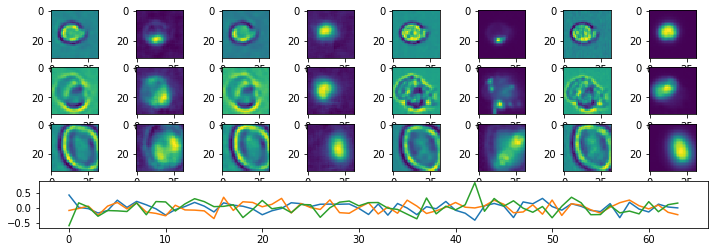

Epoch:  110 Iteration:  0 Loss:  3.67505 0.630081 0.00056693


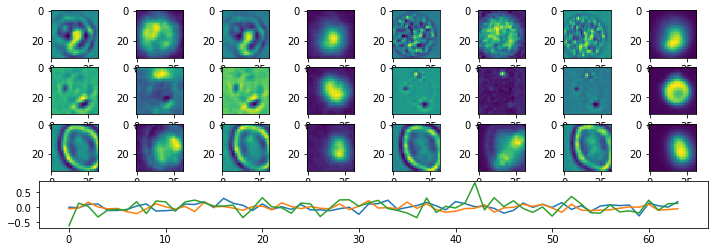

Epoch:  111 Iteration:  0 Loss:  3.6812 0.630084 0.00059545


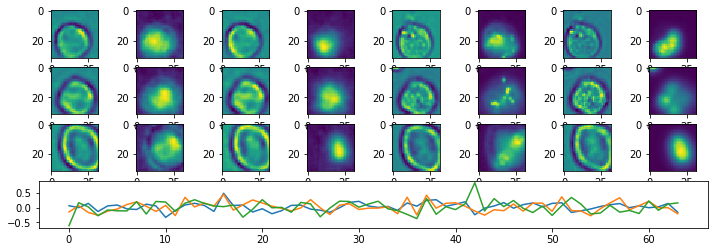

Epoch:  112 Iteration:  0 Loss:  3.62624 0.630057 0.000765681


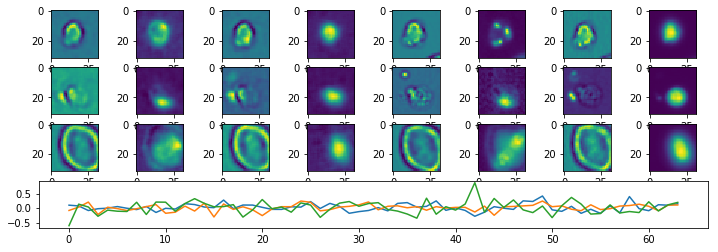

Epoch:  113 Iteration:  0 Loss:  3.64064 0.630064 0.000614375


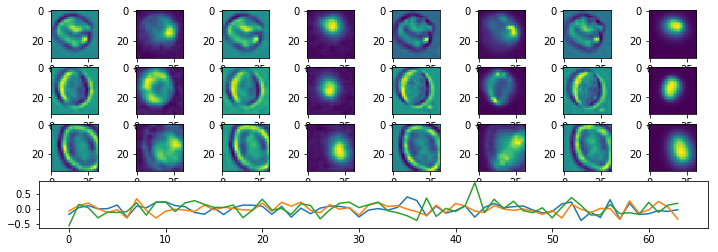

Epoch:  114 Iteration:  0 Loss:  3.61278 0.630049 0.000688255


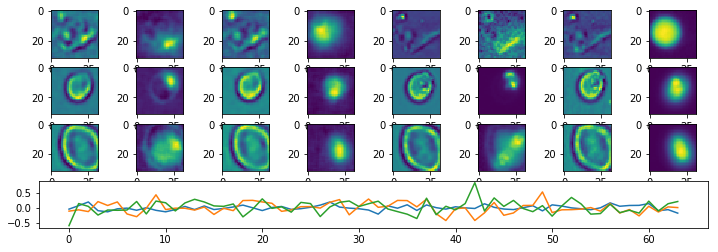

Epoch:  115 Iteration:  0 Loss:  3.63851 0.630063 0.000692606


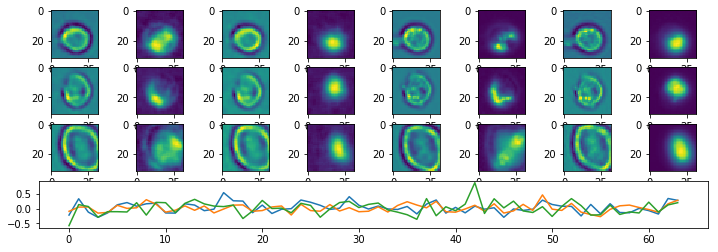

Epoch:  116 Iteration:  0 Loss:  3.62836 0.630057 0.000722378


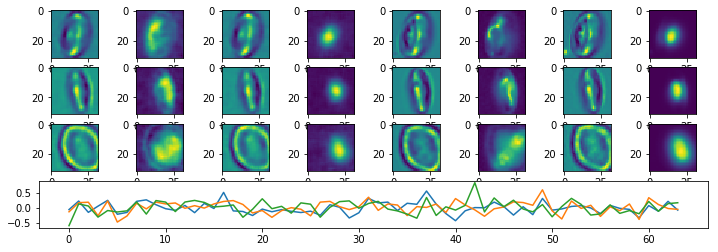

Epoch:  117 Iteration:  0 Loss:  3.60961 0.630048 0.000828415


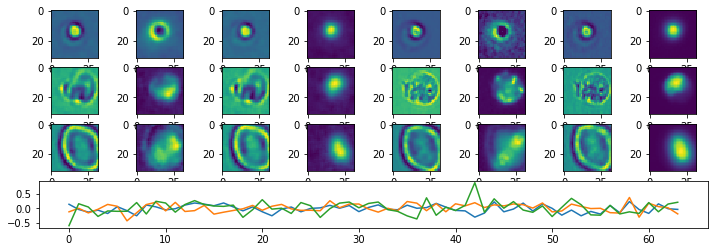

Epoch:  118 Iteration:  0 Loss:  3.57043 0.630027 0.000678569


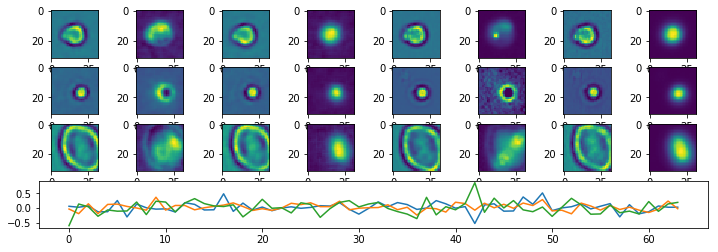

Epoch:  119 Iteration:  0 Loss:  3.60751 0.630047 0.000827789


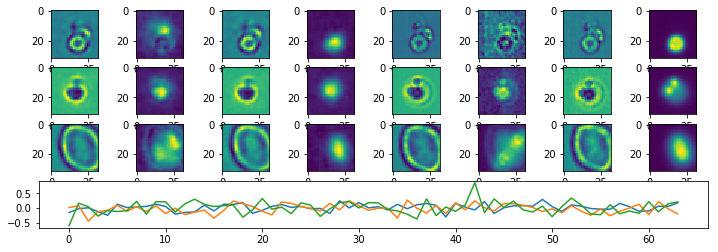

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 64 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-24-LS64"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4